# Emotional Portraits Generation - Demo Notebook

This notebook demonstrates how to use different approaches for emotion-conditioned image generation.

## Table of Contents

1. **Setup**
   - 1.1 Imports and Configuration
   - 1.2 Helper Functions for Loading Models
   - 1.3 Generation Functions

2. **Baseline Approaches** (No Training Required)
   - 2.1 Portrait Generation Baseline (Label-Only)
   - 2.2 Scene Baseline (Label Only)
   - 2.3 Scene Baseline (Label + Caption)

3. **Portrait Generation** (weights/)
   - 3.1 Portrait Generation fine tuned on RafDB (Label-Only)

4. **Scene Generation** (weights/)
   - 4.1 EmoSet Label-to-Image
   - 4.2 Emotion-Token Conditioning with LoRA
   - 4.3 Multimodal Conditioning (Caption + Emotion Embedding)
   - 4.4 Multimodal Conditioning with Emotion Classifier Reinforcement(α=0.01)
   - 4.5 Multimodal Conditioning with Emotion Classifier Reinforcement (α=0.1)
   - 4.6 Classifier Guidance (Noise-Aware Latent Classifier)

5. **Interactive Testing**

6. **Comparison: All Approaches**

7. **Notes**

All models use pretrained/finetuned weights from the `weights/` directory in this repository.


## 1. Setup

### 1.1 Imports and Configuration

In [1]:
import os
import sys
from pathlib import Path
import torch
from PIL import Image
import matplotlib.pyplot as plt
from IPython.display import display
import warnings
import gc
warnings.filterwarnings('ignore')

# Set repository root
REPO_ROOT = Path.cwd()
STORAGE_BASE = os.getenv("EMOTIONAL_PORTRAITS_BASE", str(REPO_ROOT))

# Add paths for imports
sys.path.insert(0, str(REPO_ROOT))
sys.path.insert(0, str(REPO_ROOT / "approaches" / "classifier_guidance" / "src"))

# EmoSet emotions (8 emotions)
EMOTIONS_EMOSET = [
    "amusement", "anger", "awe", "contentment",
    "disgust", "excitement", "fear", "sadness"
]

# RAFDB emotions (7 emotions)
EMOTIONS_RAFDB = [
    "anger", "disgust", "fear", "happy",
    "sad", "surprise", "neutral"
]

# Setup device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

# Automatic CUDA memory cleanup after each cell
def clear_cuda_memory():
    """Clear CUDA cache and run garbage collection."""
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        # Optionally print memory info (commented out to reduce noise)
        # allocated = torch.cuda.memory_allocated() / 1024**3
        # reserved = torch.cuda.memory_reserved() / 1024**3
        # print(f"💾 GPU Memory: {allocated:.2f} GB allocated, {reserved:.2f} GB reserved")

# Register post-execute hook to clear memory after each cell
try:
    from IPython import get_ipython
    ipython = get_ipython()
    if ipython is not None:
        # Use the correct API for IPython 7.0+ (events) or older versions (hooks)
        if hasattr(ipython, 'events'):
            # IPython 7.0+
            ipython.events.register('post_execute', lambda *args: clear_cuda_memory())
            print("✓ Automatic CUDA memory cleanup enabled (runs after each cell)")
        elif hasattr(ipython, 'hooks'):
            # Older IPython versions
            ipython.hooks.register('post_execute', lambda *args: clear_cuda_memory())
            print("✓ Automatic CUDA memory cleanup enabled (runs after each cell)")
        else:
            print("⚠ Could not find events/hooks API. Manual cleanup available via clear_cuda_memory()")
    else:
        print("⚠ Not in IPython environment. Manual cleanup available via clear_cuda_memory()")
except Exception as e:
    print(f"⚠ Could not register memory cleanup hook: {e}")
    print("  You can manually call clear_cuda_memory() after each cell")


Using device: cuda
GPU: NVIDIA RTX 4000 Ada Generation
✓ Automatic CUDA memory cleanup enabled (runs after each cell)


### 1.2 Helper Functions for Loading Models


In [2]:
def load_baseline_pipeline(device):
    """Load vanilla Stable Diffusion 1.4 pipeline."""
    from diffusers import StableDiffusionPipeline
    
    model_id = "CompVis/stable-diffusion-v1-4"
    cache_dir = os.path.join(STORAGE_BASE, "cache", "huggingface")
    
    print("Loading baseline (vanilla) Stable Diffusion 1.4 pipeline...")
    pipe = StableDiffusionPipeline.from_pretrained(
        model_id,
        torch_dtype=torch.float16 if device.type == "cuda" else torch.float32,
        safety_checker=None,
        requires_safety_checker=False,
        cache_dir=cache_dir
    )
    pipe = pipe.to(device)
    pipe.set_progress_bar_config(disable=True)
    print("✓ Baseline pipeline loaded")
    return pipe


def load_lora_pipeline(weights_dir, device):
    """Load LoRA fine-tuned pipeline."""
    from diffusers import StableDiffusionPipeline
    from peft import PeftModel
    import json
    
    model_id = "runwayml/stable-diffusion-v1-5"
    cache_dir = os.path.join(STORAGE_BASE, "cache", "huggingface")
    
    print(f"Loading LoRA pipeline from {weights_dir}...")
    
    # Load base pipeline
    pipe = StableDiffusionPipeline.from_pretrained(
        model_id,
        torch_dtype=torch.float16 if device.type == "cuda" else torch.float32,
        safety_checker=None,
        requires_safety_checker=False,
        cache_dir=cache_dir
    )
    
    # Load tokenizer info
    tokenizer_info_path = os.path.join(weights_dir, "tokenizer_info.json")
    if os.path.exists(tokenizer_info_path):
        with open(tokenizer_info_path, 'r') as f:
            tokenizer_info = json.load(f)
        emotion_tokens = tokenizer_info.get("emotion_tokens", [])
    else:
        emotion_tokens = [f"<{e}>" for e in EMOTIONS_EMOSET]
    
    # Add tokens to tokenizer
    num_added = pipe.tokenizer.add_tokens(emotion_tokens)
    if num_added > 0:
        pipe.text_encoder.resize_token_embeddings(len(pipe.tokenizer))
    
    # Load learned embeddings
    learned_embeds_path = os.path.join(weights_dir, "learned_embeds.bin")
    if os.path.exists(learned_embeds_path):
        learned_embeds = torch.load(learned_embeds_path, map_location="cpu")
        for token, embedding in learned_embeds.items():
            token_id = pipe.tokenizer.convert_tokens_to_ids(token)
            if token_id != pipe.tokenizer.unk_token_id:
                with torch.no_grad():
                    pipe.text_encoder.get_input_embeddings().weight[token_id] = embedding.to(
                        pipe.text_encoder.get_input_embeddings().weight.device
                    )
        print(f"  ✓ Loaded {len(learned_embeds)} learned embeddings")
    
    # Load LoRA weights
    if os.path.exists(os.path.join(weights_dir, "adapter_model.safetensors")):
        try:
            pipe.unet = PeftModel.from_pretrained(pipe.unet, weights_dir)
            pipe.unet = pipe.unet.merge_and_unload()
            print("  ✓ Loaded and merged LoRA weights")
        except Exception as e:
            print(f"  ⚠ Warning: Could not load LoRA: {e}")
    
    pipe = pipe.to(device)
    pipe.set_progress_bar_config(disable=True)
    print("✓ LoRA pipeline loaded")
    return pipe, emotion_tokens


def load_classifier_guidance(device):
    """Load classifier guidance pipeline and classifier."""
    from inference import load_pipeline
    from model import EmotionLatentClassifier, TimeEmbedding
    import torch.nn as nn
    import torch.nn.functional as F

    # Define large classifier class
    class EmotionLatentClassifierLarge(nn.Module):
        """Large version of EmotionLatentClassifier with 1024 hidden dim."""
        def __init__(self, num_emotions=8):
            super().__init__()
            self.time_embed = TimeEmbedding(dim=256, out_dim=1024)
            self.conv1 = nn.Conv2d(4, 128, kernel_size=3, stride=1, padding=1)
            self.bn1 = nn.BatchNorm2d(128)
            self.conv2 = nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1)
            self.bn2 = nn.BatchNorm2d(256)
            self.conv3 = nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1)
            self.bn3 = nn.BatchNorm2d(512)
            self.conv4 = nn.Conv2d(512, 1024, kernel_size=3, stride=2, padding=1)
            self.bn4 = nn.BatchNorm2d(1024)
            self.time_proj = nn.Linear(1024, 1024)
            self.global_pool = nn.AdaptiveAvgPool2d(1)
            self.classifier = nn.Linear(1024, num_emotions)
        
        def forward(self, x, timesteps):
            x = x.to(dtype=torch.float32)
            timesteps = timesteps.to(dtype=torch.float32)
            x = F.silu(self.bn1(self.conv1(x)))
            x = F.silu(self.bn2(self.conv2(x)))
            x = F.silu(self.bn3(self.conv3(x)))
            x = F.silu(self.bn4(self.conv4(x)))
            time_emb = self.time_proj(self.time_embed(timesteps))
            time_emb = time_emb[:, :, None, None].expand_as(x)
            x = x + time_emb
            x = self.global_pool(x).flatten(1)
            logits = self.classifier(x)
            return logits
    
    classifier_weights_dir = os.path.join(REPO_ROOT, "weights", "classifier_guidance")
    
    print("Loading classifier guidance pipeline...")
    pipe = load_pipeline(device=device)
    
    # Try to load classifier_large.pt first, fallback to classifier.pt
    classifier_path = os.path.join(classifier_weights_dir, "classifier_large.pt")
    if not os.path.exists(classifier_path):
        classifier_path = os.path.join(classifier_weights_dir, "classifier.pt")
    
    if not os.path.exists(classifier_path):
        raise FileNotFoundError(f"Classifier not found at {classifier_path}")
    
    # Load checkpoint to detect model size
    checkpoint = torch.load(classifier_path, map_location="cpu")
    
    # Get state dict
    if 'model_state_dict' in checkpoint:
        state_dict = checkpoint['model_state_dict']
    else:
        state_dict = checkpoint
    
    # Detect hidden_dim from classifier.weight shape [8, hidden_dim]
    if 'classifier.weight' in state_dict:
        hidden_dim = state_dict['classifier.weight'].shape[1]
    else:
        # Default to standard size
        hidden_dim = 512
        print(f"⚠ Warning: Could not detect model size, defaulting to 512")
    
    print(f"Detected model hidden_dim: {hidden_dim}")
    
    # Create appropriate model based on detected size
    if hidden_dim == 1024:
        classifier = EmotionLatentClassifierLarge(num_emotions=8)
    else:
        classifier = EmotionLatentClassifier(num_emotions=8)
    
    # Convert state dict to float32 and load
    state_dict_fp32 = {}
    for key, value in state_dict.items():
        if isinstance(value, torch.Tensor) and value.dtype != torch.int64:
            state_dict_fp32[key] = value.to(dtype=torch.float32)
        else:
            state_dict_fp32[key] = value
    
    classifier.load_state_dict(state_dict_fp32)
    classifier = classifier.to(device)
    classifier = classifier.float()
    classifier.eval()
    classifier.requires_grad_(False)
    
    print(f"✓ Loaded classifier from {classifier_path}")
    return pipe, classifier


def load_scripts_pipeline(weights_dir, device, is_multimodal=False):
    """Load pipeline from scripts format (pytorch_lora_weights.safetensors)."""
    from diffusers import StableDiffusionPipeline
    from torch import nn
    
    model_id = "CompVis/stable-diffusion-v1-4"
    cache_dir = os.path.join(STORAGE_BASE, "cache", "huggingface")
    
    print(f"Loading scripts pipeline from {weights_dir}...")
    
    # Load base pipeline
    pipe = StableDiffusionPipeline.from_pretrained(
        model_id,
        torch_dtype=torch.float16 if device.type == "cuda" else torch.float32,
        safety_checker=None,
        requires_safety_checker=False,
        cache_dir=cache_dir
    )
    
    # Load LoRA weights (diffusers format)
    pytorch_lora_path = os.path.join(weights_dir, "pytorch_lora_weights.safetensors")
    if os.path.exists(pytorch_lora_path):
        pipe.load_lora_weights(weights_dir)
        print("  ✓ Loaded LoRA weights")
    else:
        print(f"  ⚠ Warning: pytorch_lora_weights.safetensors not found")
    
    # Load emotion embedding if multimodal
    emotion_embedding = None
    if is_multimodal:
        emotion_embedding_path = os.path.join(weights_dir, "emotion_embedding.pth")
        if os.path.exists(emotion_embedding_path):
            emotion_embedding = nn.Embedding(len(EMOTIONS_EMOSET), pipe.text_encoder.config.hidden_size)
            emotion_embedding.load_state_dict(torch.load(emotion_embedding_path, map_location=device))
            emotion_embedding.eval()
            emotion_embedding = emotion_embedding.to(device)
            print("  ✓ Loaded emotion embedding")
        else:
            print(f"  ⚠ Warning: emotion_embedding.pth not found")
    
    pipe = pipe.to(device)
    pipe.set_progress_bar_config(disable=True)
    print("✓ Scripts pipeline loaded")
    return pipe, emotion_embedding


### 1.3 Generation Functions


In [3]:
def generate_portrait_baseline(pipe, emotion, seed=42, num_steps=50, guidance_scale=7.5):
    """Generate portrait using baseline SD 1.4."""
    prompt = f"a photorealistic human portrait depicting {emotion}, head and shoulders, looking at camera"
    generator = torch.Generator(device=device).manual_seed(seed)
    image = pipe(
        prompt=prompt,
        num_inference_steps=num_steps,
        guidance_scale=guidance_scale,
        generator=generator,
    ).images[0]
    return image, prompt


def generate_scene_baseline_label_only(pipe, scene_prompt, emotion, seed=42, num_steps=50, guidance_scale=7.5):
    """Generate scene using baseline SD 1.4 with emotion label only."""
    prompt = emotion  # Just the emotion label
    generator = torch.Generator(device=device).manual_seed(seed)
    image = pipe(
        prompt=prompt,
        num_inference_steps=num_steps,
        guidance_scale=guidance_scale,
        generator=generator,
    ).images[0]
    return image, prompt


def generate_scene_baseline_label_caption(pipe, scene_prompt, emotion, seed=42, num_steps=50, guidance_scale=7.5):
    """Generate scene using baseline SD 1.4 with scene + emotion."""
    prompt = f"{scene_prompt}, {emotion}"
    generator = torch.Generator(device=device).manual_seed(seed)
    image = pipe(
        prompt=prompt,
        num_inference_steps=num_steps,
        guidance_scale=guidance_scale,
        generator=generator,
    ).images[0]
    return image, prompt


def generate_lora_baseline(pipe, scene_prompt, emotion, emotion_tokens, seed=42, num_steps=50, guidance_scale=7.5):
    """Generate scene using LoRA fine-tuned model."""
    emotion_token = f"<{emotion}>"
    prompt = f"{emotion_token} {scene_prompt}"
    generator = torch.Generator(device=device).manual_seed(seed)
    image = pipe(
        prompt=prompt,
        num_inference_steps=num_steps,
        guidance_scale=guidance_scale,
        generator=generator,
    ).images[0]
    return image, prompt


def generate_classifier_guidance(pipe, classifier, scene_prompt, emotion, seed=42, num_steps=50, guidance_scale=7.5, classifier_scale=20.0):
    """Generate scene using classifier guidance."""
    from inference import generate_with_classifier_guidance
    
    emotion_idx = EMOTIONS_EMOSET.index(emotion) if emotion in EMOTIONS_EMOSET else 0
    
    image, _ = generate_with_classifier_guidance(
        pipe=pipe,
        classifier=classifier,
        prompt=scene_prompt,
        target_emotion_idx=emotion_idx,
        num_inference_steps=num_steps,
        guidance_scale=guidance_scale,
        classifier_scale=classifier_scale,
        seed=seed,
        device=device,
        track_metrics=False,
        use_wandb=False,
    )
    return image, scene_prompt


def generate_scripts_label2image(pipe, emotion, seed=42, num_steps=50, guidance_scale=7.5):
    """Generate using scripts label2image approach (emotion label only)."""
    prompt = emotion  # Just the emotion label
    generator = torch.Generator(device=device).manual_seed(seed)
    image = pipe(
        prompt=prompt,
        num_inference_steps=num_steps,
        guidance_scale=guidance_scale,
        generator=generator,
    ).images[0]
    return image, prompt


def generate_scripts_portrait(pipe, emotion, seed=42, num_steps=50, guidance_scale=7.5):
    """Generate portrait using scripts portraits approach."""
    prompt = f"a photorealistic human portrait depicting {emotion}, head and shoulders, looking at camera"
    generator = torch.Generator(device=device).manual_seed(seed)
    image = pipe(
        prompt=prompt,
        num_inference_steps=num_steps,
        guidance_scale=guidance_scale,
        generator=generator,
    ).images[0]
    return image, prompt


def generate_scripts_multimodal(pipe, emotion_embedding, scene_prompt, emotion, seed=42, num_steps=50, guidance_scale=7.5):
    """Generate using scripts multimodal approach (caption + emotion embedding)."""
    import sys
    scripts_path = os.path.join(REPO_ROOT, "scripts")
    if scripts_path not in sys.path:
        sys.path.insert(0, scripts_path)
    from train_text_to_image_lora import generate_with_emotion
    
    emotion_idx = EMOTIONS_EMOSET.index(emotion) if emotion in EMOTIONS_EMOSET else 0
    generator = torch.Generator(device=device).manual_seed(seed)
    
    # Ensure emotion_embedding is on the correct device
    if emotion_embedding is not None:
        emotion_embedding = emotion_embedding.to(device)
    
    image = generate_with_emotion(
        pipe,
        emotion_embedding,
        scene_prompt,
        emotion_idx,
        generator=generator,
        num_inference_steps=num_steps
    )
    return image, scene_prompt


def display_images(images, titles, figsize=(15, 3)):
    """Display a grid of images with titles."""
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=figsize)
    if n == 1:
        axes = [axes]
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img)
        ax.set_title(title, fontsize=10)
        ax.axis('off')
    plt.tight_layout()
    plt.show()


def display_model_emotion_grid(approach_configs, emotions, scene_prompt="", seed=42, figsize_per_cell=(3, 3)):
    """
    Display a grid comparing models (rows) × emotions (columns).
    
    Args:
        approach_configs: List of dicts with keys:
            - 'name': Display name for the approach
            - 'generate_func': Function to generate image (pipe, emotion, scene_prompt, seed) -> (img, prompt)
            - 'args': Dict of additional args to pass to generate_func
        emotions: List of emotion strings to test
        scene_prompt: Scene description (if applicable)
        seed: Random seed
        figsize_per_cell: Figure size per cell (width, height)
    """
    num_models = len(approach_configs)
    num_emotions = len(emotions)
    
    # Create grid: rows = models, cols = emotions
    fig, axes = plt.subplots(
        num_models, 
        num_emotions, 
        figsize=(figsize_per_cell[0] * num_emotions, figsize_per_cell[1] * num_models)
    )
    
    # Handle single row/column case
    if num_models == 1:
        axes = axes.reshape(1, -1)
    if num_emotions == 1:
        axes = axes.reshape(-1, 1)
    
    # Generate all images
    print(f"Generating {num_models} models × {num_emotions} emotions = {num_models * num_emotions} images...")
    for i, config in enumerate(approach_configs):
        model_name = config['name']
        generate_func = config['generate_func']
        func_args = config.get('args', {})
        
        for j, emotion in enumerate(emotions):
            try:
                # Call generation function with appropriate arguments
                # All wrapper functions accept (emotion, scene_prompt, seed, **kwargs)
                img, prompt = generate_func(emotion, scene_prompt=scene_prompt, seed=seed, **func_args)
                
                # Display in grid
                ax = axes[i, j]
                ax.imshow(img)
                ax.axis('off')
                
                # Set labels
                if i == 0:  # Top row: emotion labels
                    ax.set_title(emotion, fontsize=11, fontweight='bold', pad=5)
                if j == 0:  # Left column: model names
                    ax.set_ylabel(model_name, fontsize=10, rotation=0, ha='right', va='center')
                    
            except Exception as e:
                error_msg = str(e)
                # Truncate long error messages but show more context
                if len(error_msg) > 50:
                    error_msg = error_msg[:47] + "..."
                axes[i, j].text(0.5, 0.5, f"Error:\n{error_msg}", 
                               ha='center', va='center', fontsize=8, color='red',
                               wrap=True, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
                axes[i, j].axis('off')
                print(f"  ⚠ Error generating {model_name} for {emotion}: {error_msg}")
    
    plt.tight_layout()
    plt.show()
    print(f"✓ Grid comparison complete!")


## 2. Baseline Approaches


### 2.1 Portrait Generation Baseline (Label-Only)

Generate emotional portraits using vanilla SD 1.4 with emotion labels.

Loading baseline (vanilla) Stable Diffusion 1.4 pipeline...


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 13.89it/s]


✓ Baseline pipeline loaded


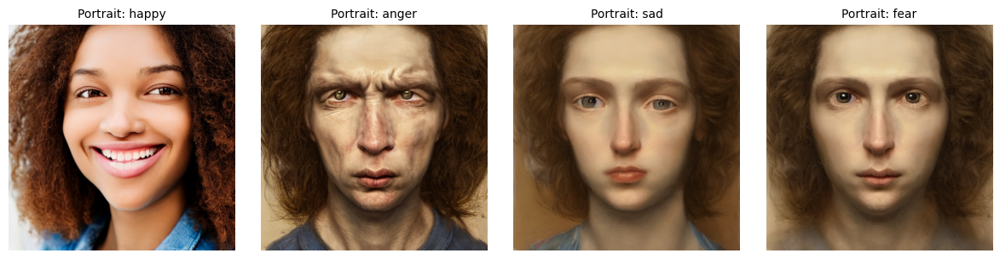

In [4]:
# Load baseline pipeline
baseline_pipe = load_baseline_pipeline(device)

# Generate portraits for different emotions
emotions_to_test = ["happy", "anger", "sad", "fear"]
images = []
titles = []

for emotion in emotions_to_test:
    img, prompt = generate_portrait_baseline(baseline_pipe, emotion, seed=42)
    images.append(img)
    titles.append(f"Portrait: {emotion}")

display_images(images, titles, figsize=(12, 3))
clear_cuda_memory()

### 2.2 Scene Baseline (Label Only)

Generate scenes using vanilla SD 1.4 with emotion labels only (no scene description).


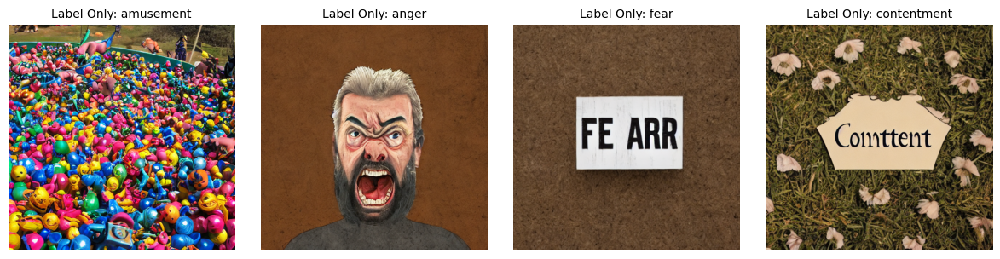

In [5]:
# Generate scenes with emotion labels only
emotions_to_test = ["amusement", "anger", "fear", "contentment"]
images = []
titles = []

for emotion in emotions_to_test:
    img, prompt = generate_scene_baseline_label_only(baseline_pipe, "", emotion, seed=42)
    images.append(img)
    titles.append(f"Label Only: {emotion}")

display_images(images, titles, figsize=(12, 3))
clear_cuda_memory()

### 2.3 Scene Baseline (Label + Caption)

Generate scenes using vanilla SD 1.4 with scene description + emotion label.


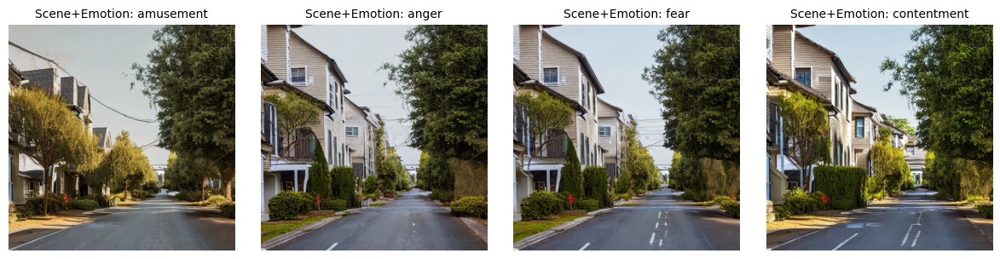

Scene prompt: 'A quiet residential street with parked cars and trees'


In [6]:
# Test with a scene prompt
scene_prompt = "A quiet residential street with parked cars and trees"
emotions_to_test = ["amusement", "anger", "fear", "contentment"]
images = []
titles = []

for emotion in emotions_to_test:
    img, prompt = generate_scene_baseline_label_caption(baseline_pipe, scene_prompt, emotion, seed=42)
    images.append(img)
    titles.append(f"Scene+Emotion: {emotion}")

display_images(images, titles, figsize=(12, 3))
print(f"Scene prompt: '{scene_prompt}'")
clear_cuda_memory()


# 3. Portrail Generation

### 3.1 Portrait Generation fine tuned on RafDB (Label-Only)

Fine-tuned on RafDB using emotion labels as the sole conditioning input.

Loading scripts pipeline from /users/eleves-a/2025/yash.bhardwaj/EmotionalPortraitsGeneration/weights/portraits...


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 16.83it/s]
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


  ✓ Loaded LoRA weights
✓ Scripts pipeline loaded


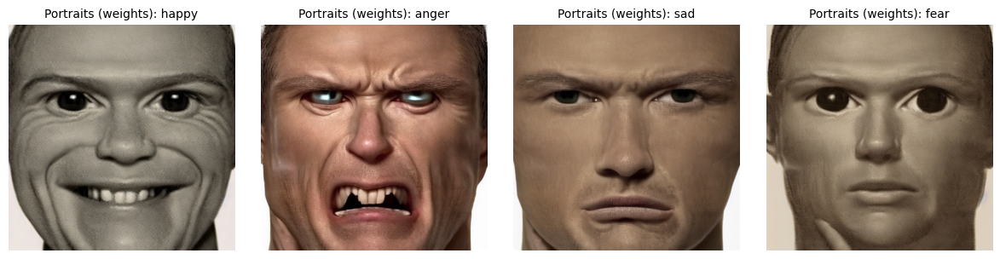

In [7]:
# Load portraits pipeline (weights)
portraits_weights_dir = os.path.join(REPO_ROOT, "weights", "portraits")
portraits_pipe, _ = load_scripts_pipeline(portraits_weights_dir, device, is_multimodal=False)

# Generate portraits for different emotions
emotions_to_test = ["happy", "anger", "sad", "fear"]
images = []
titles = []

for emotion in emotions_to_test:
    img, prompt = generate_scripts_portrait(portraits_pipe, emotion, seed=42)
    images.append(img)
    titles.append(f"Portraits (weights): {emotion}")

display_images(images, titles, figsize=(12, 3))
clear_cuda_memory()


# 4. Scene Genereation Approaches

### 4.1 EmoSet Label-to-Image

Fine-tuned on EmoSet-118K with emotion labels only (no scene descriptions).


Loading scripts pipeline from /users/eleves-a/2025/yash.bhardwaj/EmotionalPortraitsGeneration/weights/emoset_label2image...


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 17.53it/s]
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


  ✓ Loaded LoRA weights
✓ Scripts pipeline loaded


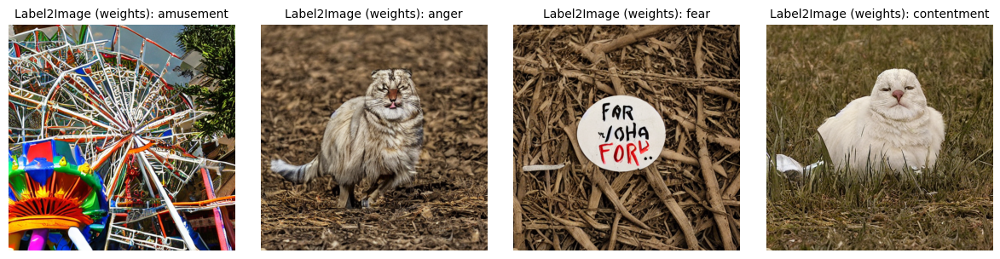

In [8]:
# Load emoset_label2image pipeline (weights)
label2image_weights_dir = os.path.join(REPO_ROOT, "weights", "emoset_label2image")
label2image_pipe, _ = load_scripts_pipeline(label2image_weights_dir, device, is_multimodal=False)

# Generate scenes with emotion labels only
emotions_to_test = ["amusement", "anger", "fear", "contentment"]
images = []
titles = []

for emotion in emotions_to_test:
    img, prompt = generate_scripts_label2image(label2image_pipe, emotion, seed=42)
    images.append(img)
    titles.append(f"Label2Image (weights): {emotion}")

display_images(images, titles, figsize=(12, 3))


### 4.2 Emotion-Token Conditioning with LoRA

Generate scenes using fine-tuned SD 1.5 with LoRA adapters and learned emotion embeddings. Captions from BLIP2.


Loading LoRA pipeline from /users/eleves-a/2025/yash.bhardwaj/EmotionalPortraitsGeneration/weights/25K/baseline_lora...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 17.51it/s]
The new embeddings will be initialized from a multivariate normal distribution that has old embeddings' mean and covariance. As described in this article: https://nlp.stanford.edu/~johnhew/vocab-expansion.html. To disable this, use `mean_resizing=False`


  ✓ Loaded 8 learned embeddings
  ✓ Loaded and merged LoRA weights
✓ LoRA pipeline loaded


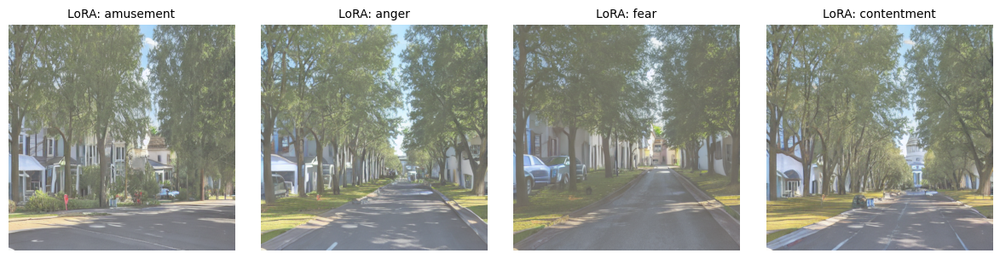

Scene prompt: 'A quiet residential street with parked cars and trees'


In [9]:
# Load LoRA pipeline (using 25K weights, can also use 10K)
weights_dir = os.path.join(REPO_ROOT, "weights", "25K", "baseline_lora")
lora_pipe, emotion_tokens = load_lora_pipeline(weights_dir, device)

# Generate scenes with LoRA
scene_prompt = "A quiet residential street with parked cars and trees"
emotions_to_test = ["amusement", "anger", "fear", "contentment"]
images = []
titles = []

for emotion in emotions_to_test:
    img, prompt = generate_lora_baseline(lora_pipe, scene_prompt, emotion, emotion_tokens, seed=42)
    images.append(img)
    titles.append(f"LoRA: {emotion}")

display_images(images, titles, figsize=(12, 3))
print(f"Scene prompt: '{scene_prompt}'")


### 4.3 Multimodal Conditioning (Caption + Emotion Embedding)

Uses BLIP2-generated captions + learnable emotion embedding. E_cond = [e_emo; E_text]


Loading scripts pipeline from /users/eleves-a/2025/yash.bhardwaj/EmotionalPortraitsGeneration/weights/emoset_multicond...


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 18.52it/s]
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


  ✓ Loaded LoRA weights
  ✓ Loaded emotion embedding
✓ Scripts pipeline loaded


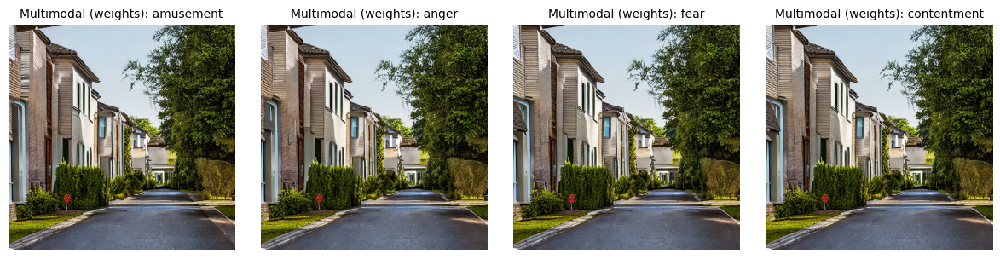

Scene prompt: 'A quiet residential street with parked cars and trees'


In [16]:
# Load multimodal pipeline (weights)
multicond_weights_dir = os.path.join(REPO_ROOT, "weights", "emoset_multicond")
multicond_pipe, multicond_emotion_embedding = load_scripts_pipeline(multicond_weights_dir, device, is_multimodal=True)

# Generate scenes with multimodal conditioning
scene_prompt = "A quiet residential street with parked cars and trees"
emotions_to_test = ["amusement", "anger", "fear", "contentment"]
images = []
titles = []

for emotion in emotions_to_test:
    img, prompt = generate_scripts_multimodal(
        multicond_pipe, multicond_emotion_embedding, scene_prompt, emotion, seed=42
    )
    images.append(img)
    titles.append(f"Multimodal (weights): {emotion}")

display_images(images, titles, figsize=(12, 3))
print(f"Scene prompt: '{scene_prompt}'")

### 4.4 Multimodal Conditioning with Emotion Classifier Reinforcement (α=0.01)

Multimodal conditioning with EmoCLIP classifier reinforcement (L = L_diff + 0.01 * L_class)


Loading scripts pipeline from /users/eleves-a/2025/yash.bhardwaj/EmotionalPortraitsGeneration/weights/emoset_multicond_classifier_001...


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 17.75it/s]
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


  ✓ Loaded LoRA weights
  ✓ Loaded emotion embedding
✓ Scripts pipeline loaded


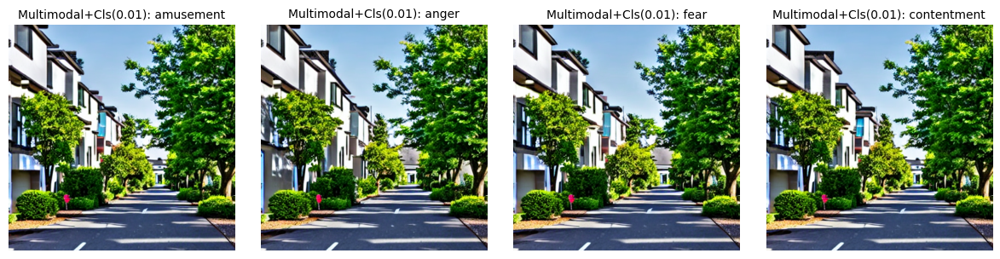

Scene prompt: 'A quiet residential street with parked cars and trees'


In [11]:
# Load multimodal + classifier (α=0.01) pipeline (weights)
multicond_cls001_weights_dir = os.path.join(REPO_ROOT, "weights", "emoset_multicond_classifier_001")
multicond_cls001_pipe, multicond_cls001_emotion_embedding = load_scripts_pipeline(multicond_cls001_weights_dir, device, is_multimodal=True)

# Generate scenes
scene_prompt = "A quiet residential street with parked cars and trees"
emotions_to_test = ["amusement", "anger", "fear", "contentment"]
images = []
titles = []

for emotion in emotions_to_test:
    img, prompt = generate_scripts_multimodal(
        multicond_cls001_pipe, multicond_cls001_emotion_embedding, scene_prompt, emotion, seed=42
    )
    images.append(img)
    titles.append(f"Multimodal+Cls(0.01): {emotion}")

display_images(images, titles, figsize=(12, 3))
print(f"Scene prompt: '{scene_prompt}'")
clear_cuda_memory()

### 4.5 Multimodal Conditioning with Emotion Classifier Reinforcement (α=0.1)

Multimodal conditioning with EmoCLIP classifier reinforcement (L = L_diff + 0.1 * L_class)


Loading scripts pipeline from /users/eleves-a/2025/yash.bhardwaj/EmotionalPortraitsGeneration/weights/emoset_multicond_classifier_01...


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 17.75it/s]
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


  ✓ Loaded LoRA weights
  ✓ Loaded emotion embedding
✓ Scripts pipeline loaded


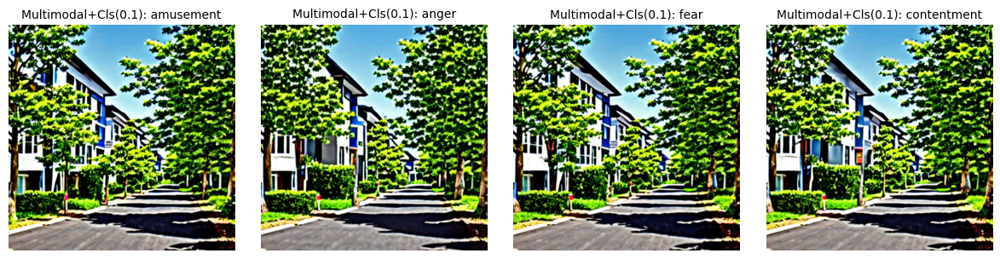

Scene prompt: 'A quiet residential street with parked cars and trees'


In [12]:
# Load multimodal + classifier (α=0.1) pipeline (weights)
multicond_cls01_weights_dir = os.path.join(REPO_ROOT, "weights", "emoset_multicond_classifier_01")
multicond_cls01_pipe, multicond_cls01_emotion_embedding = load_scripts_pipeline(multicond_cls01_weights_dir, device, is_multimodal=True)

# Generate scenes
scene_prompt = "A quiet residential street with parked cars and trees"
emotions_to_test = ["amusement", "anger", "fear", "contentment"]
images = []
titles = []

for emotion in emotions_to_test:
    img, prompt = generate_scripts_multimodal(
        multicond_cls01_pipe, multicond_cls01_emotion_embedding, scene_prompt, emotion, seed=42
    )
    images.append(img)
    titles.append(f"Multimodal+Cls(0.1): {emotion}")

display_images(images, titles, figsize=(12, 3))
print(f"Scene prompt: '{scene_prompt}'")


### 4.6 Classifier Guidance (Noise-Aware Latent Classifier)

Generate scenes using SD 1.5 guided by a noise-aware latent classifier.

Loading classifier guidance pipeline...


Loading pipeline components...:  71%|███████▏  | 5/7 [00:00<00:00, 47.04it/s]

Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 15.34it/s]


Detected model hidden_dim: 1024
✓ Loaded classifier from /users/eleves-a/2025/yash.bhardwaj/EmotionalPortraitsGeneration/weights/classifier_guidance/classifier_large.pt


Denoising: 100%|██████████| 51/51 [00:02<00:00, 20.42step/s]


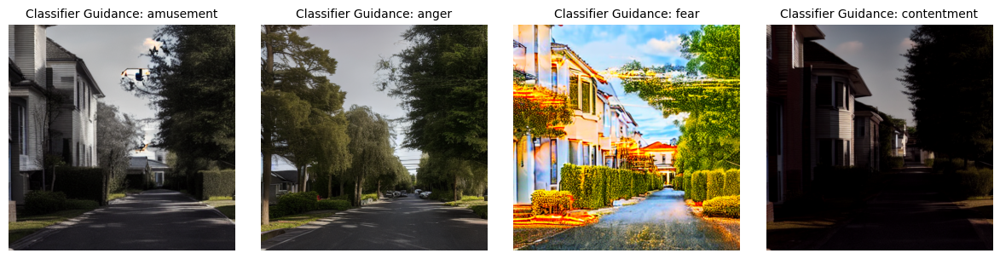

Scene prompt: 'A quiet residential street with parked cars and trees'


In [13]:
# Load classifier guidance
cg_pipe, classifier = load_classifier_guidance(device)

# Generate scenes with classifier guidance
scene_prompt = "A quiet residential street with parked cars and trees"
emotions_to_test = ["amusement", "anger", "fear", "contentment"]
images = []
titles = []

for emotion in emotions_to_test:
    img, prompt = generate_classifier_guidance(
        cg_pipe, classifier, scene_prompt, emotion, 
        seed=42, classifier_scale=20.0
    )
    images.append(img)
    titles.append(f"Classifier Guidance: {emotion}")

display_images(images, titles, figsize=(12, 3))
print(f"Scene prompt: '{scene_prompt}'")


## 5. Interactive Testing

Test your own prompts and emotions!


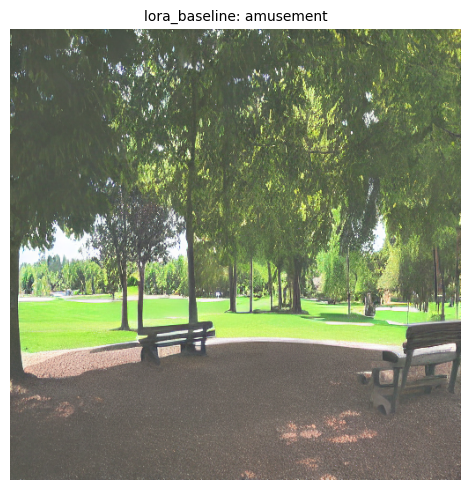

Prompt used: '<amusement> A park with trees and benches'


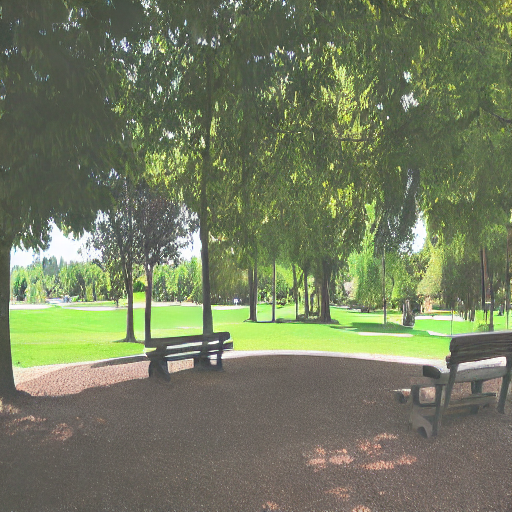

In [14]:
# Custom test function
def test_approach(approach_name, scene_prompt, emotion, seed=42):
    """Test a specific approach with custom prompt and emotion."""
    
    if approach_name == "portrait_baseline":
        img, prompt = generate_portrait_baseline(baseline_pipe, emotion, seed=seed)
        
    elif approach_name == "scene_baseline_label_only":
        img, prompt = generate_scene_baseline_label_only(baseline_pipe, "", emotion, seed=seed)
        
    elif approach_name == "scene_baseline_label_caption":
        img, prompt = generate_scene_baseline_label_caption(baseline_pipe, scene_prompt, emotion, seed=seed)
        
    elif approach_name == "lora_baseline":
        img, prompt = generate_lora_baseline(lora_pipe, scene_prompt, emotion, emotion_tokens, seed=seed)
        
    elif approach_name == "classifier_guidance":
        img, prompt = generate_classifier_guidance(
            cg_pipe, classifier, scene_prompt, emotion, seed=seed, classifier_scale=20.0
        )
    
    # Scripts approaches
    elif approach_name == "portraits":
        img, prompt = generate_scripts_portrait(portraits_pipe, emotion, seed=seed)
        
    elif approach_name == "emoset_label2image":
        img, prompt = generate_scripts_label2image(label2image_pipe, emotion, seed=seed)
        
    elif approach_name == "emoset_multicond":
        img, prompt = generate_scripts_multimodal(
            multicond_pipe, multicond_emotion_embedding, scene_prompt, emotion, seed=seed
        )
        
    elif approach_name == "emoset_multicond_classifier_001":
        img, prompt = generate_scripts_multimodal(
            multicond_cls001_pipe, multicond_cls001_emotion_embedding, scene_prompt, emotion, seed=seed
        )
        
    elif approach_name == "emoset_multicond_classifier_01":
        img, prompt = generate_scripts_multimodal(
            multicond_cls01_pipe, multicond_cls01_emotion_embedding, scene_prompt, emotion, seed=seed
        )
    else:
        raise ValueError(f"Unknown approach: {approach_name}")
    
    display_images([img], [f"{approach_name}: {emotion}"], figsize=(5, 5))
    print(f"Prompt used: '{prompt}'")
    return img

# Example usage:
test_approach("lora_baseline", "A park with trees and benches", "amusement", seed=123)
# test_approach("emoset_multicond", "A beach at sunset", "contentment", seed=456)


## 6. Comparison: All Approaches

Compare all approaches side-by-side for the same scene and emotion.


Denoising: 100%|██████████| 51/51 [00:02<00:00, 20.32step/s]


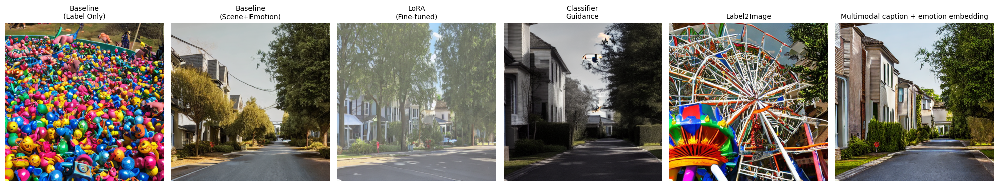

Scene: 'A quiet residential street with parked cars and trees'
Emotion: 'amusement'


In [15]:
clear_cuda_memory()
def compare_all_approaches(scene_prompt, emotion, seed=42):
    """Compare all approaches for the same scene and emotion."""
    
    images = []
    titles = []
    
    # Scene baseline (label only)
    img, _ = generate_scene_baseline_label_only(baseline_pipe, "", emotion, seed=seed)
    images.append(img)
    titles.append("Baseline\n(Label Only)")
    
    # Scene baseline (label + caption)
    img, _ = generate_scene_baseline_label_caption(baseline_pipe, scene_prompt, emotion, seed=seed)
    images.append(img)
    titles.append("Baseline\n(Scene+Emotion)")
    
    # LoRA baseline
    img, _ = generate_lora_baseline(lora_pipe, scene_prompt, emotion, emotion_tokens, seed=seed)
    images.append(img)
    titles.append("LoRA\n(Fine-tuned)")
    
    # Classifier guidance
    img, _ = generate_classifier_guidance(
        cg_pipe, classifier, scene_prompt, emotion, seed=seed, classifier_scale=20.0
    )
    images.append(img)
    titles.append("Classifier\nGuidance")
    
    # Scripts approaches
    img, _ = generate_scripts_label2image(label2image_pipe, emotion, seed=seed)
    images.append(img)
    titles.append("Label2Image")
    
    img, _ = generate_scripts_multimodal(
        multicond_pipe, multicond_emotion_embedding, scene_prompt, emotion, seed=seed
    )
    images.append(img)
    titles.append("Multimodal caption + emotion embedding")
    
    display_images(images, titles, figsize=(20, 4))
    print(f"Scene: '{scene_prompt}'")
    print(f"Emotion: '{emotion}'")

# Example comparison
compare_all_approaches("A quiet residential street with parked cars and trees", "amusement", seed=42)


## 7. Notes

### 7.1 Baseline Approaches
- **Portrait Generation Baseline (Label-Only)**: Uses vanilla SD 1.4 with emotion-only prompts for portrait generation
- **Scene Generation Baseline (Label-Only)**: Uses vanilla SD 1.4 with just emotion labels (no scene description)
- **Scene Generation Baseline (Label+Caption)**: Uses vanilla SD 1.4 with scene description + emotion label concatenated

### 7.2 Portrait Generation (weights/)
- **Portrait Generation (Label-Only Prompting)**: Fine-tuned on RafDB using emotion labels as sole conditioning input

### 7.3 Scene Generation Approaches (weights/)
- **General Image Generation (Label-Only Prompting)**: Fine-tuned on EmoSet-118K with emotion labels only (no scene descriptions)
- **Emotion-Token Conditioning with LoRA**: Uses fine-tuned SD 1.5 with LoRA adapters and learned emotion token embeddings
- **Multimodal Conditioning (Caption + Emotion Embedding)**: Uses BLIP2-generated captions + learnable emotion embedding (E_cond = [e_emo; E_text])
- **Multimodal Conditioning with Emotion Classifier Reinforcement (α=0.01)**: Multimodal with EmoCLIP classifier reinforcement (L = L_diff + 0.01 * L_class)
- **Multimodal Conditioning with Emotion Classifier Reinforcement (α=0.1)**: Multimodal with EmoCLIP classifier reinforcement (L = L_diff + 0.1 * L_class)
- **Classifier Guidance (Noise-Aware Latent Classifier)**: Uses SD 1.5 with a noise-aware latent classifier for gradient-based guidance

All models use pretrained/finetuned weights from the `weights/` directory in this repository.
